# Lecture 4

###### **NOTE**: NOT ALL MATERIAL IN THIS DOCUMENT WILL BE COVERED IN LECTURE TO THE DEPTH THAT IT IS COVERED IN THIS DOCUMENT.

#### V. Hunter Adams (vha3), MAE 4160/5160, Spring 2020

In [2]:
from IPython.display import Latex
from IPython.display import Image
from IPython.core.display import HTML

## Other Reading

1. SMAD 19

## In this *DOCUMENT* (not everything in this document will be covered in lecture) . . .

#### Dynamics Review

1. Derivation of Transport Equation.
2. Derivation of torque-free motion equations.
3. Stability analysis for torque-free motion.
4. Energy analysis for torque-free motion.
4. Historical anecdote about energy dissipation.
5. Derivation of equation of motion for spacecraft with reaction wheels/thrusters.
6. Discussion of control moment gyroscopes.

#### Attitude Determination Review

7. Review of TRIAD for attitude determination.

#### Hardware Review

1. Star trackers.
2. Sun/Earth sensors.
3. Horizon sensors.
4. Magnetometers.
5. CDGPS.
6. MEMS gyros.
7. Bugs!
8. Fiber-optic gyros.
9. Optical navigation.

## Attitude Kinematics/Dynamics Review

I want to start this lecture by reviewing how we derive the equation of motion for a spacecraft that may be either uncontrolled or acted upon by reaction wheels, control moment gyroscopes, thrusters, dampers, and other actuators. I believe that you have all seen this content, either in part or in full, in your other classes (4060, and perhaps 3260). That is ok. These equations, and the equations which describe the spacecraft's trajectory, are the foundational equations upon which any spacecraft's attitude determination and control systems are built. It is a good idea to see them again.

Also, because you have seen some of this material before, I am going to review it by presenting it in a way that you perhaps have not seen before. I think this is the appropriate way to important material like this because, at worst, doing so will show you things that you've already seen. At best, presenting it in a new way will improve your understanding of these concepts. *You should get into the habit of looking back at old concepts and ideas as you learn new concepts and ideas. You almost always see them in a new light.*

My goal is to remove every shred of magic or mystery from these equations by deriving them from very, very basic principles. You likely have not seen that entire process. You will have taken classes where you get the mathematical tools for the basic principles (calculus, linear algebra, etc.) and you will have taken classes that use the final equations to draw conclusions about the system. But now that you've done both, you have the ability to look at the entire derivation. We can look at old concepts with new knowledge and (maybe) see them in new light.

**Note**: **There will be aspects of this document that will seem very elementary to you. I'm not including this content because I think you don't know it, I'm including it for completeness.**

### The Transport Equation (aka Basic Kinematic Equation)

There is one equation at the foundation of attitude dynamics, determination, and control. It is the famous Transport Theorem, shown below:

\begin{align}
\frac{{}^Nd}{dt}\textbf{v} &= \frac{{}^{B}d}{dt}\textbf{v} + \omega^{B/N} \times \textbf{v}
\end{align}

This equation tells us that the time derivative of some vector in an inertial (not moving) frame (N) is equal to the time derivative of that vector in a rotating frame (B) plus the cross product between the rotation rate between the two frames and the vector. This equation is fundamental enough that it is often handed to you as something foundational to be remembered (and it is), but let's revisit it with a senior-level background in calculus and physics to try to get a visceral understanding for why this equation must be what it is.

Suppose that we have two frames, one of which is rotating and the other of which is inertial. The inertial frame, $N$, is represented by the unit vectors $\hat{i}$, $\hat{j}$, and $\hat{k}$. To represent the rotating frame, $B$, we'll simply add primes to each unit vector: $\hat{i}'$, $\hat{j}'$, $\hat{k}'$. The $B$ frame is rotating at some constant rate $\omega^{B/N}$, as shown below. In the below image, the $B$ frame happens to be rotating along the $\hat{k}$ axis, but it could be spinning around any arbitrary axis.

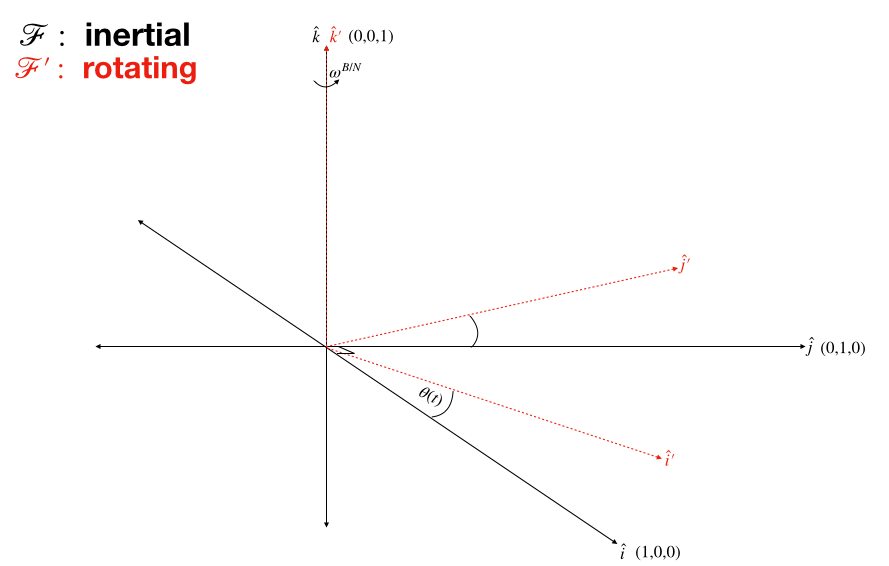

In [7]:
Image("frames.png", width=500)

Now suppose that we have some (potentially time-varying) vector $\textbf{v}$, which is represented in the rotating $B$ frame, as illustrated below. Perhaps this is the boresight of some instrument, which is known in the spacecraft body frame (which is spinning relative to the inertial frame).

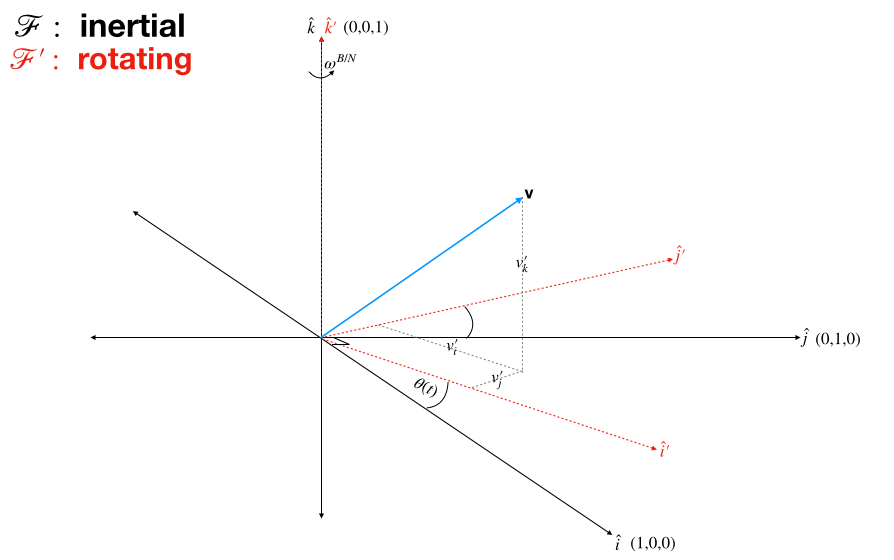

In [6]:
Image("addv.png", width=500)

What we would like to know is the time derivative of $\textbf{v}(t)$ in the *inertial* frame.

Let's just go through the steps that we would take to start doing that, and we'll discover that we arrive at the Transport Theorem. Start by simply writing down $\textbf{v}$ in its $B$ frame components, which we know.

\begin{align}
{}^{B}\textbf{v} = v_i' \hat{\textbf{i}}' + v_j' \hat{\textbf{j}}' + v_k' \hat{\textbf{k}}'
\end{align}

And now let's take the total derivative in order to get the expression for the rate of change of $\textbf{v}$ in the inertial frame. Using the Chain Rule:

\begin{align}
\frac{{}^Nd}{dt}\textbf{v} &= \left[ \left(\frac{d}{dt} v_i'\right) \hat{\textbf{i}}' + v_i' \left(\frac{d}{dt} \hat{\textbf{i}}'\right) \right] + \left[ \left(\frac{d}{dt} v_j'\right) \hat{\textbf{j}}' + v_j' \left(\frac{d}{dt} \hat{\textbf{j}}'\right) \right] + \left[ \left(\frac{d}{dt} v_k'\right) \hat{\textbf{k}}' + v_k' \left(\frac{d}{dt} \hat{\textbf{k}}'\right) \right]
\end{align}

Rearranging:

\begin{align}
\frac{{}^Nd}{dt}\textbf{v} &= \left[ \left(\frac{d}{dt} v_i'\right) \hat{\textbf{i}}' + \left(\frac{d}{dt} v_j'\right) \hat{\textbf{j}}' +  \left(\frac{d}{dt} v_k'\right) \hat{\textbf{k}}' \right] + \left[ v_i' \left(\frac{d}{dt} \hat{\textbf{i}}'\right)  + v_j' \left(\frac{d}{dt} \hat{\textbf{j}}'\right)   + v_k' \left(\frac{d}{dt} \hat{\textbf{k}}'\right) \right]
\end{align}

Pause for a moment and think about the above expression. In the case that the $B$ and $N$ frames were not rotating relative to one another, what would happen to the second term? It would go to zero, because the unit vectors for the $B$ frame would be constant (derivatives=0) for the $N$ frame.

What is the first term? The first term is just the time derivative of $\textbf{v}$ in the $B$ frame! So we can rewrite this:

\begin{align}
\frac{{}^Nd}{dt}\textbf{v} &= \frac{{}^{B}d}{dt}\textbf{v} + \left[ v_i' \left(\frac{d}{dt} \hat{\textbf{i}}'\right)  + v_j' \left(\frac{d}{dt} \hat{\textbf{j}}'\right)   + v_k' \left(\frac{d}{dt} \hat{\textbf{k}}'\right) \right]
\end{align}

All that remains is to inerpret the time derivatives of the rotating $B$ basis vectors. In the most general case, the rate of change of some vector can be decomposed into a radial component (changing length) and a tangential component (changing direction). Since we are dealing with *fixed-length unit vectors*, they have no rate of change in the radial direction (i.e. they are not changing length). So, the derivatives of these vectors are entirely in the tangential direction. We could systematically prove this by differentiating the orthogonality rules, but I don't think that's necessary.

This reduces to phyics that you learned in high school. Think of each unit vector as a position vector (fixed length) undergoing circular motion. What is the equation for the tangential velocity of that vector? It is the angular velocity crossed with the position vector! $v = \omega \times \textbf{r}$. So, substituting into our above expression and simplifying:

\begin{align}
\frac{{}^Nd}{dt}\textbf{v} &= \frac{{}^{B}d}{dt}\textbf{v} + \left[ v_i' \left(\omega^{B/N} \times \hat{\textbf{i}}'\right)  + v_j' \left(\omega^{B/N} \times \hat{\textbf{j}}'\right)   + v_k' \left(\omega^{B/N} \times \hat{\textbf{k}}'\right) \right]\\
&= \frac{{}^{B}d}{dt}\textbf{v} + \left[  \left(\omega^{B/N} \times v_i'\hat{\textbf{i}}'\right)  +  \left(\omega^{B/N} \times v_j'\hat{\textbf{j}}'\right)   +  \left(\omega^{B/N} \times v_k'\hat{\textbf{k}}'\right) \right]\\
&= \frac{{}^{B}d}{dt}\textbf{v} + \omega^{B/N} \times \left[ v_i'\hat{\textbf{i}}'  +  v_j'\hat{\textbf{j}}'  +   v_k'\hat{\textbf{k}}' \right]\\
&= \frac{{}^{B}d}{dt}\textbf{v} + \omega^{B/N} \times \textbf{v}
\end{align}

There is nothing mysterious here. The Transport Theorem *must* be what it is, because nothing else would make sense.

### Torque-free equations of motion

In order to understand the rotational motion of a spacecraft, we are interested in the inertial derivative of one specific vector: *the angular momentum*. This is how we arrive at the torques (the rotational analogues for forces) acting on the spacecraft.

\begin{align}
\tau &= \frac{{}^{N}d}{dt}\textbf{H}
\end{align}

Where, you'll recall, the angular momentum is equal to the spacecraft inertial tensor dotted with the angular velocity. I'm using $I_c$ to designate the inertia tensor of the spacecraft, and $\textbf{H}_c$ to denote the angular momentum of the spacecraft.

\begin{align}
\textbf{H}_c &= I_c \cdot \omega^{B/N}
\end{align}

We can use the Transport Theorem that we've just derived in order to get an expression for this torque.

\begin{align}
\tau &= \frac{{}^{N}d}{dt}\textbf{H}_c\\
&= \frac{{}^Bd}{dt}\textbf{H}_c + \omega^{B/N} \times \textbf{H}_c\\
&= \frac{{}^Bd}{dt}\left(I_c \cdot \omega^{B/N}\right) + \omega^{B/N} \times \left(I_c \cdot \omega^{B/N}\right)\\
&= I_c \cdot \left(\frac{{}^Bd}{dt}\omega^{B/N}\right) + \omega^{B/N} \times \left(I_c \cdot \omega^{B/N}\right)
\end{align}

For clarity, I'm going to replace inertial derivatives with a superscript $N$, and body-frame derivatives with a superscript $B$. Rewriting the above:

\begin{align}
\tau = \overset{N}{\textbf{H}}_c = I_c \cdot \left(\overset{B}{\omega}^{B/N}\right) + \omega^{B/N} \times \left(I_c \cdot \omega^{B/N}\right)
\end{align}

We will start by considering the torque-free case (no thrusters, torque coils, etc). In this case, the above expression for the torque is set to 0.

\begin{align}
\tau = \overset{N}{\textbf{H}}_c = I_c \cdot \left(\overset{B}{\omega}^{B/N}\right) + \omega^{B/N} \times \left(I_c \cdot \omega^{B/N}\right) = 0
\end{align}

#### A brief aside on the inertia tensor

Recall that the inertia tensor describes the distribution of mass in an object, and that it has certain properties. They will be symmetric and (for physical systems) positive definite. So, the most general form of the above inertia tensor, $I_c$, can be written as:

\begin{align}
I_c &= \begin{bmatrix}
I_{11} & I_{12} & I_{13}\\
I_{12} & I_{22} & I_{23}\\
I_{13} & I_{23} & I_{33}\end{bmatrix}
\end{align}

where $I_{11}$, $I_{22}$ and $I_{33}$ are positive. However! It is *always* possible to diagonalize the inertia tensor. In other words, it is always possible to choose a $B$-frame coordinate system such that the mass of the object is evenly distributed around each axis. More mathematically put, we can align our $B$-frame coordinate system with the eigenvectors of the inertia tensor. Thus, if we assume that we've judiciously chosen our $B$ frame coordinates to align with the eigenvectors of the inertia tensor, then we can rewrite the above as below without loss of generality.

\begin{align}
I_c &= \begin{bmatrix}
I_{11} & 0 & 0\\
0 & I_{22} & 0\\
0 & 0 & I_{33}\end{bmatrix}
\end{align}

We call these the *principle axes*. When we're doing analysis, we almost always do so under the assumption that our non-inertial frames align with the principle axes.

#### Back to torque-free motion

We want to analyze each component of our spacecraft's angular velocity in a torque-free situation. To do so, we can rewrite our Transport Theorem equation in matrix form, so that we can then isolate each component of the angular velocity.

\begin{align}
\overset{N}{\textbf{H}}_c &= I_c \cdot \left(\overset{B}{\omega}^{B/N}\right) + \omega^{B/N} \times \left(I_c \cdot \omega^{B/N}\right)\\
&= \begin{bmatrix}
I_{11} & 0 & 0\\
0 & I_{22} & 0\\
0 & 0 & I_{33}\end{bmatrix} \begin{bmatrix} 
\dot{\omega}_1\\
\dot{\omega}_2\\
\dot{\omega}_3
\end{bmatrix}^{B/N}+ \begin{bmatrix}
0 & -\omega_3 & \omega_2\\
\omega_3 & 0 & -\omega_1\\
-\omega_2 & \omega_1 & 0
\end{bmatrix}\left(\begin{bmatrix}
I_{11} & 0 & 0\\
0 & I_{22} & 0\\
0 & 0 & I_{33}\end{bmatrix} \begin{bmatrix} 
\omega_1\\
\omega_2\\
\omega_3
\end{bmatrix}^{B/N}\right) =  \begin{bmatrix}
0\\0\\0\end{bmatrix}
\end{align}

If we perform all of this matrix multiplication, simplify, and separate into the three equations associated with the 3x1 vector, then we arrive at the following set of equations:

\begin{align}
I_1 \dot{\omega}_1 &= \left(I_2 - I_3\right) \omega_2 \omega_3\\
I_2 \dot{\omega}_2 &= \left(I_3 - I_1\right) \omega_3 \omega_1\\
I_3 \dot{\omega}_3 &= \left(I_1 - I_2\right) \omega_1 \omega_2
\end{align}

#### Stability of the above equations

**Maximum Axis**: Let's assume that $I_1 > I_2 > I_3$. Consider the situation in which the spacecraft (or whatever object) is rotating about the axis with moment of inertia $I_1$ (it's rotating about the axis with the greatest moment of inertia). Furthermore, assume very small angular velocities in the other two directions ($\omega_2$, $\omega_3$ small). Under the assumption of small $\omega_2$ and $\omega_3$, the first equation above tells us that $\dot{\omega}_1$ is very small and can be neglected. Let's consider what happens to the other two components of the angular velocity.

We'll start with $\omega_2$. Differentiate the second equation above:

\begin{align}
I_2 \ddot{\omega_2} &= (I_3 - I_1) \dot{\omega}_3 \omega_1 + (I_3-I_1) \omega_3 \dot{\omega}_1
\end{align}

Under the assumption of very small $\omega_2$ and $\omega_3$, we know that $\dot{\omega}_1$ is negligibly small. So, the second term may be eliminated. We can substitute the third equation above in for $\dot{\omega}_3$ in the second term:

\begin{align}
\ddot{\omega}_2 &= \frac{(I_3-I_1)(I_1 - I_2)}{I_2I_3} \omega_1^2 \omega_2\\
&= (\text{negative quantity}) \omega_2
\end{align}

What is this an equation for? It's Hooke's Law! This is the equation for a simple harmonic oscillator. Precisely the same analysis shows that we also get a simple harmonic oscillator for $\omega_3$. So, spinning around the maximium axis is *stable*.

**Minimum Axis**: Now the situation in which the spacecraft (or whatever object) is rotating about the axis with moment of inertia $I_3$ (it's rotating about the axis with the smallest moment of inertia). Furthermore, assume very small angular velocities in the other two directions ($\omega_1$, $\omega_2$ small). Under the assumption of small $\omega_1$ and $\omega_2$, the third equation above tells us that $\dot{\omega}_3$ is very small and can be neglected. Let's consider what happens to the other two components of the angular velocity.

We'll again start with $\omega_2$. Differentiate the second equation above:

\begin{align}
I_2 \ddot{\omega_2} &= (I_3 - I_1) \dot{\omega}_3 \omega_1 + (I_3-I_1) \omega_3 \dot{\omega}_1
\end{align}

Under the assumption of very small $\omega_1$ and $\omega_2$, we know that $\dot{\omega}_3$ is negligibly small. So, the first term may be eliminated. We can substitute the first equation above in for $\dot{\omega}_1$ in the second term:

\begin{align}
\ddot{\omega}_2 &= \frac{(I_3-I_1)(I_2 - I_3)}{I_2I_1} \omega_3^2 \omega_2\\
&= \text{(negative quantity}) \omega_2
\end{align}

And, again, we would get a similar expression for $\omega_1$. So, for spin about the minimum axis too, the system is stable. The transverse angular velocities will oscillate (i.e. we have precession), but it is stable.

**Intermediate Axis**: Now the situation in which the spacecraft (or whatever object) is rotating about the axis with moment of inertia $I_2$ (it's rotating about the axis with the intermediate moment of inertia). Furthermore, assume very small angular velocities in the other two directions ($\omega_1$, $\omega_3$ small). Under the assumption of small $\omega_1$ and $\omega_3$, the second equation above tells us that $\dot{\omega}_2$ is very small and can be neglected. Let's consider what happens to the other two components of the angular velocity.

Let's look at $\omega_1$. Differentiate the first equation above.

\begin{align}
I_1 \ddot{\omega_1} &= (I_2 - I_3) \dot{\omega_2}\omega_3 + (I_2 - I_3) \omega_2 \dot{\omega_3}
\end{align}

Eliminate the first term, and substitute for the second term:

\begin{align}
\ddot{\omega_1} &= \frac{(I_2 - I_3)(I_1 - I_2)}{I_1I_3} \omega_2^2  \omega_1 \\
&= (\textbf{positive quantity}) \omega_1
\end{align}

In the case of rotation about the intermediate axis, $\omega_1$ (and, by similar analysis, $\omega_3$) is **unstable** and will therefore grow. Even a small disturbance along other axes will cause the object to flip, as shown in the video below. You can try this yourself too. Try to flip your phone end over end without it rotating along any other axes.

<iframe width="560" height="315" src="https://www.youtube.com/embed/1n-HMSCDYtM" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

#### Brief aside about energy

Consider again these equations.

\begin{align}
I_1 \dot{\omega}_1 &= \left(I_2 - I_3\right) \omega_2 \omega_3\\
I_2 \dot{\omega}_2 &= \left(I_3 - I_1\right) \omega_3 \omega_1\\
I_3 \dot{\omega}_3 &= \left(I_1 - I_2\right) \omega_1 \omega_2
\end{align}

Notice what happens if we premultiply the first, second, and third equations by $\omega_1$, $\omega_2$, and $\omega_3$, respectively, and then sum all three equations:

\begin{align}
\omega_1I_1 \dot{\omega}_1 + \omega_2I_2 \dot{\omega}_2 + \omega_3I_3 \dot{\omega}_3 &=  \omega_1\left(I_2 - I_3\right) \omega_2 \omega_3 + \omega_2\left(I_3 - I_1\right) \omega_3 \omega_1+\omega_3\left(I_1 - I_2\right) \omega_1 \omega_2\\
&= \omega_1 \omega_2 \omega_3 \left[I_2-I_3+I_3-I_1+I_1-I_2 \right]\\
&= 0
\end{align}

This is interesting, because it tells us something about the energy in the system. Consider the expression for the rotational kinetic energy of the spacecraft, shown below:

\begin{align}
T &= \frac{1}{2} \omega^{{B/N}^T} \cdot I_c \cdot \omega^{B/N}\\
&= \frac{1}{2}\left[I_2 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2\right]
\end{align}

Differentiate:

\begin{align}
\frac{d}{dt}T &= \frac{1}{2}\left[2I_2 \omega_1 \dot{\omega}_1 + 2 I_2 \omega_2 \dot{\omega}_2 + 2 I_3 \omega_3 \dot{\omega}_3\right]\\
&= \omega_1I_1 \dot{\omega}_1 + \omega_2I_2 \dot{\omega}_2 + \omega_3I_3 \dot{\omega}_3\\
&= 0 \text{ as shown above}
\end{align}

We've just shown that the rotational kinetic energy is a constant. Thus, the following equation must be true:

\begin{align}
T &= \frac{1}{2}\left[I_2 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2\right] = \text{constant}
\end{align}

*This is the equation for an ellipsoid.* Thus, the angular velocity of the spacecraft is constrained to move on the surface of an ellipsoid. But, in fact, there is another constraint. The magnitude of the angular momentum vector is also conserved.

\begin{align}
||\textbf{H}_c||^2 &= \left(I_c \cdot \omega^{B/N}\right)^T \left(I_c \cdot \omega^{B/N}\right)\\
&= \omega^{{B/N}^T} I_c^T I_c \omega^{B/N}\\
&= I_1^2 \omega_1^2 + I_2^2 \omega_2^2 + I_3^2 \omega_3^2
\end{align}

This is the expression for *another* ellipsoid. The angular velocity must satisfy both of these expressions, so it may only travel on the intersections of these two ellipsoids. These intersections are called *polhodes*, and they are either circular or taco-shaped, as shown below.

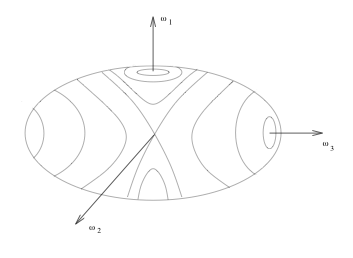

In [10]:
Image("poinsot.png", width=300)

We can visually see the stability of the major and minor axes by looking at this ellipsoid. We see that the angular velocity vector will walk around the minimum/maximum axes, and that there is an infinitesimally small equilibrium point associated with the intermediate axis. We can use the three torque-free equations that we've been analyzing to draw the direction that the vector walk along each of these contours. 

The precession of the angular velocity vector around these principle axes is called *nutation*. We see nutation when the spacecraft either has too much energy to spin about the maximum axis, or too little energy to spin about the minimum axis. Which raises the following question:

#### What if energy is getting dissipated?

Suppose that our spacecraft has a small amount of non-rigidity that allows for some energy dissipation. This may come in the form of fuel slosh, floppy antennas, wiggling solar panel arms, etc. We assume that this non-rigidity is small enough that the inertia tensor for the spacecraft is well approximated as constant. How does the spacecraft behave in this case?

Remember, even when energy is being dissipated, the magnitude of the angular momentum vector remains contant in the body frame (again, with no external torques from thrusters, etc.), and the vector itself remains constant in the inertial frame.

\begin{align}
||\textbf{H}_c||^2 &= I_1^2 \omega_1^2 + I_2^2 \omega_2^2 + I_3^2 \omega_3^2
\end{align}

\begin{align}
2T &= I_2 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2
\end{align}

Let's define some new terms that allow us to consider both of the transverse axes as a pair:

\begin{align}
\omega_t &= \left(\omega_1^2 + \omega_2^2\right)^{\frac{1}{2}}\\
I_t &= I_1 = I_2
\end{align}

With the above quantities defined, we can rewrite the expressions for $||\textbf{H}_c||^2$ and $2T$:

\begin{align}
||\textbf{H}_c||^2 &= I_t^2 \omega_t^2 + I_3^2 \omega_3^2\\
2T &= I_t \omega_t^2 + I_3 \omega_3^2
\end{align}

The above expression for the kinetic energy can be rewritten in terms of the angular momentum magnitude:

\begin{align}
2T &= I_t \omega_t^2 - \left(\frac{I_t^2 \omega_t^2 - ||\textbf{H}_c||^2}{I_3}\right)
\end{align}

(If you substitute in for $||\textbf{H}_c||^2$ and simplify, you'll find that you get $2T = I_t \omega_t^2 + I_3 \omega_3^2$, as before). Rearranging:

\begin{align}
2T &= I_t\left(1 - \frac{I_t}{I_3}\right) \omega_t^2 + \frac{||\textbf{H}_c||^2}{I_3}
\end{align}

Now we take the total derivative. Recall that the magnitude of the angular momentum remains constant, even with energy dissipation, so the second term disappears when we differentiate. I will leave the derivative for $\omega_t^2$ unevaluated, since this is what we're interested in solving for:

\begin{align}
2\dot{T} &= I_t\left(1 - \frac{I_t}{I_3}\right) \frac{d}{dt}\left(\omega_t^2\right)
\end{align}

Solve for the derivative of the squared transverse angular velocity:

\begin{align}
\frac{d}{dt} \omega_t^2 &= \frac{2\dot{T}}{I_t \left(1 - \frac{I_t}{I_3}\right)}
\end{align}

Consider the above equation. In the case of energy dissipation, $\dot{T}<0$. If $I_3 > I_t$, then the denominator is positive, and consequently the derivative of the squared transverse angular velocity is negative. In other words, spin about the *maximum* axis is *stable* in the case of energy dissipation. A spacecraft shaped like a frisbee, with energy dissipation, will tend to lose all nutation and spin perfectly about its maximum axis.

In the case that $I_3 < I_t$ (i.e. a spacecraft shaped like a pencil), the rate of change for the transverse angular velocity is *positive*. So, spinning about the minimum axis is *unstable* in the case of energy dissipation. A pencil-shaped spacecraft that is spinning stably about its maximum axis will begin to nutate more and more as energy gets dissipated. Eventually, it will fall over and start spinning about its maximum axis.

We can visualize this on the Poinsot ellipsoid. As energy is dissipated, the angular velocity spirals away from the minimum axis, falls over the intermediate axis, and spirals toward the maximum axis.

**Question**: What happens if we start *adding* energy to the system?

#### Historical consequences of energy dissipation

The Explorer 1 spacecraft is picture below, launched 1958. It was designed to spin about its minimum axis. Look at this spacecraft, what do you think happened and why?

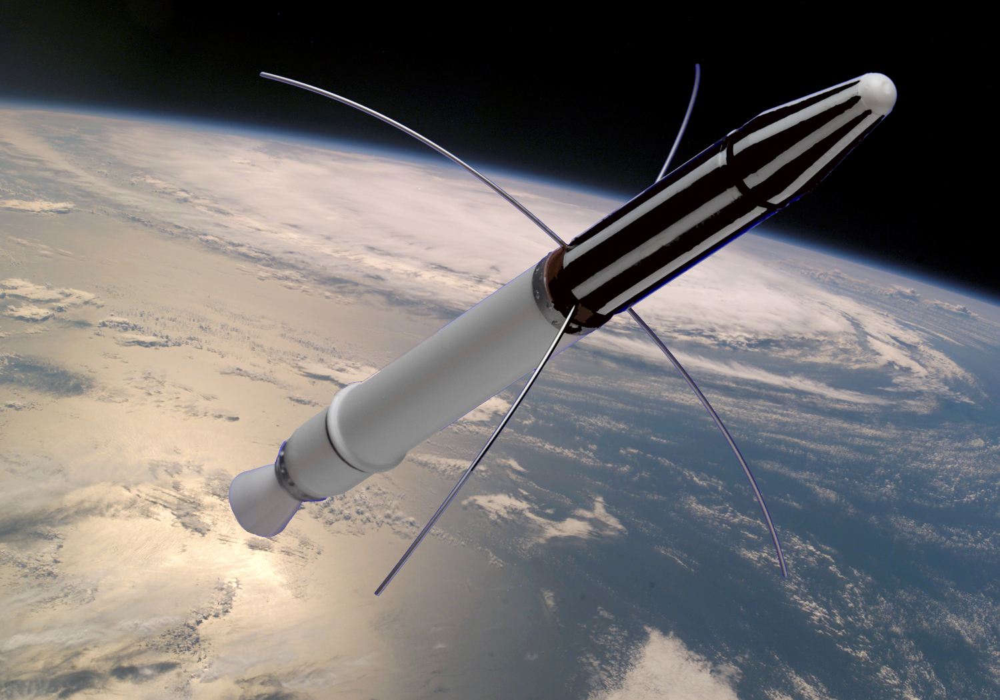

In [15]:
Image("explorer.jpeg", width=500)

Those floppy antennas dissipated energy, and the spacecraft ended up falling over and spinning about its max axis. This was a hard lesson learned to *design your spacecraft for favorable dynamics*.

### Adding reaction wheels

We now have all of the tools required to derive the equations of motion for spacecraft with complicated arrangements of reaction wheels. We will do so systematically.

As before, we find the torque acting on the spacecraft by taking the inertial derivative of the *total* angular momentum vector:

\begin{align}
\tau &= \overset{N}{\textbf{H}}_{tot}
\end{align}

Up to now, we've been imagining the spacecraft as a rigid body, so the total angular momentum has just been the angular momentum of the spacecraft body itself. Now, however, we're adding actuators. So the *total* angular momentum of the system includes the angular momentum of the spacecraft body, as before, *plus* the momentum contributions from each actuator. 

\begin{align}
\textbf{H}_{tot} &= \textbf{H}_c + \textbf{H}_{rw1} + \textbf{H}_{rw2} + \dots + \textbf{H}_{rwN}
\end{align}

As before, $H_c = I_c \omega^{B/N}$. But what about the reaction wheels? These take a similarly simple form:

\begin{align}
\textbf{H}_{rwi} &= I_{rwi} \omega^{RWi/N}
\end{align}

That is to say, the angular momentum of reaction wheel $i$ is calculated by dotting the inertia of reaction wheel $i$ with the angular velocity of reaction wheel $i$ *relative to the inertial frame*. Fortunately, the angular velocity has some nice properties that allow for us to write down the rate of the wheel with respect to the inertial frame in terms of things that we either know, or that we are solving for. We'll use the following properties:

\begin{align}
\omega^{A/B} + \omega^{B/C} &= \omega^{A/C}\\
\overset{N}\omega^{B/N} &= \overset{B}\omega^{B/N}
\end{align}

(Can you prove the second property using the Transport Theorem?) We can simply add angular velocity thru frames. So, in our case:

\begin{align}
\omega^{RWi/N} &= \omega^{RWi/B} + \omega^{B/N}
\end{align}

The angular velocity of the reaction wheel relative to the inertial frame is equal to the angular velocity of the reaction wheel relative to the spacecraft body (something that we command, measure, and know), *plus* the angular velocity of the spacecraft relative to the inertial frame (which is what we're solving for). So for any particular reaction wheel, we can write down the angular momentum as:

\begin{align}
\textbf{H}_{rwi} &= I_{rwi} \left[\omega^{RWi/B} + \omega^{B/N}\right]
\end{align}

Our expression for the total angular momentum takes the following form:

\begin{align}
\textbf{H}_{tot} &= \textbf{H}_c + \textbf{H}_{rw1} + \textbf{H}_{rw2} + \dots + \textbf{H}_{rwN}\\
&= I_c \omega^{B/N} + I_{rw1} \left(\omega^{RW1/B} + \omega^{B/N}\right)  + I_{rw2} \left(\omega^{RW2/B} + \omega^{B/N}\right) + \dots + I_{rwN} \left(\omega^{RWN/B} + \omega^{B/N}\right)\\
&= \left[I_c + I_{rw1} + I_{rw2} + \dots + I_{rwN}\right] \omega^{B/N} + \left(I_{rw1} \omega^{RW1/B} + I_{rw2} \omega^{RW2/B} + \dots + I_{rwN} \omega^{RWN/B}\right)\\
&= \left[ I_c + \sum_{i=1}^N I_{rwi}\right] \omega^{B/N} + \sum_{i=0}^N I_{rwi} \omega^{RWi/B}\\
&= I_{tot} \omega^{B/N} + \sum_{i=0}^N I_{rwi} \omega^{RWi/B}
\end{align}

Where $I_{tot}$ in the first term of the final expression above is the sum of the body and all reaction wheel inertia tensors. In order to get the equation of motion, we differentiate exactly as we did previously. There's a bit more bookkeeping involved now, but we're turning exactly the same crank.

\begin{align}
\overset{N}{\textbf{H}}_{tot} &= \left[I_{tot} \dot{\omega}^{B/N} + \sum_{i=0}^N I_{rwi} \dot{\omega}^{RWi/B}\right] + \omega^{B/N} \times \left[I_{tot} \omega^{B/N} + \sum_{i=0}^N I_{rwi} \omega^{RWi/B}\right] = \tau_{ext}
\end{align}

where $\tau_{ext}$ is equal to the external torque induced by any thrusters, torque coils, etc. If the spacecraft is not being thrusted, then we just set that equal to zero. If it is using thrusters, then the total external torque is the sum of the torque contributions from each thruster, which is simply $\tau_{i} = \textbf{r}_i \times F_i$. The torque from thruster $i$ is the cross product of the vector from the center of mass to the thruster with the force produced by that thruster. But let's just keep that as a general $\tau_{ext}$ in order to arrive at a general equation of motion for a spacecraft with reaction wheels and with or without thrusters.

In order to arrive at the equation of motion for our spacecraft, we solve for $\dot{\omega}^{B/N}$:

\begin{align}
\dot{\omega}^{B/N} &= -I_{tot}^{-1}\left[ \sum_{i=0}^N I_{rwi} \dot{\omega}^{RWi/B} + \left(\omega^{B/N} \times \left[I_{tot} \omega^{B/N} + \sum_{i=0}^N I_{rwi} \omega^{RWi/B}\right]\right) - \tau_{ext}\right]
\end{align}

This is an equation that we can plug into Python or Matlab and integrate in order to simulate the spacecraft's motion. We simply plug in the particular inertia tensors associated with our spacecraft, and the particular angular velocity vectors associated with our reaction wheels, and any thrusters, and solve.

### Control Moment Gyroscopes

Torque is simply the derivative of angular momentum. So, in order to exert a torque on the spacecraft body, we must change the angular momentum vector of the momentum actuator. There are only two ways to change a vector: you can change its length, and you can change its direction.

Reaction wheels exert a torque on the spacecraft body by changing the length of their angular momentum vectors. They spin faster or slower (grow/shrink the vector) in order to cause the spacecraft body to spin in order to save momentum. Reaction wheels are relatively simple to write controllers for, they can point extremely precisely, but they are not particularly fast at slewing a spacecraft (unless you're willing to spend a lot of power).

CMG's exert a torque on the spacecraft body by changing the *direction* of the angular momentum vector, rather than its magnitude. Instead of spinning faster or slower, CMG's spin at a constant rate. In order to exert a torque, the spinning CMG is rotated so that its angular momentum vector moves in inertial space. In order to conserve angular momentum, the spacecraft body reacts.

CMG's are able to exert much greater torque for much less power on a spacecraft, at the cost of money and complexity. They are considerably more difficult to write controllers for than reaction wheels. However, if you need a lot of agility, CMG's may be the way to go.

The dynamics of CMG's are covered in 6060. However, the dynamics are essentially an extension of what we've already done with reaction wheels, but with a few more terms. You all have all the required tools in your toolbelt for analyzing these actuators.

## Attitude Determination Review

### Theory

When we are doing attitude determination, we are trying to figure out the rotation that takes us from alignment with a known inertial frame into alignment with the spacecraft body frame. We do so by comparing vectors which are known in the inertial frame to those *same* vectors as measured in the spacecraft body frame, using onboard sensors. With sufficient measurements, we can compare the same vectors measured in each frame in order to determine how to rotate from one frame to another.

There are many methods for solving this problem. See *Davenport Q*, *FOAM*, *ESOQ*, *The SVD Method*, and more. For sake of review, I will go through the simplest method for performing attitude determination, known as Tri-Axial Attitude Determination, or TRIAD.

#### The case of three reference vectors

Suppose three vectors $\textbf{v}_1$, $\textbf{v}_2$, and $\textbf{v}_3$. These vectors may be represented in the inertial frame (${}^N\textbf{v}_1$, ${}^N\textbf{v}_2$, ${}^N\textbf{v}_3$) or they may be represented in the body frame (${}^B\textbf{v}_1$, ${}^B\textbf{v}_2$, and ${}^B\textbf{v}_3$). To translate from one frame to another, we do a rotation. That rotation may be represented as a direction cosine matrix, as shown below.

\begin{align}
{}^N\textbf{v}_1 &= {}^NQ^B {}^{B}\textbf{v}_1\\
{}^N\textbf{v}_2 &= {}^NQ^B {}^{B}\textbf{v}_2\\
{}^N\textbf{v}_3 &= {}^NQ^B {}^{B}\textbf{v}_3
\end{align}

We can stack all three of these vectors in a matrix, and consolidate the above three expressions into the single expression below:

\begin{align}
{}^{N}\begin{bmatrix}
\textbf{v}_1 & \textbf{v}_2 & \textbf{v}_3\end{bmatrix} &= {}^{N}Q^B{}^{B}\begin{bmatrix}
\textbf{v}_1 & \textbf{v}_2 & \textbf{v}_3\end{bmatrix}
\end{align}

We can solve for the rotation matrix directly:

\begin{align}
{}^{N}Q^B &= {}^{N}\begin{bmatrix}
\textbf{v}_1 & \textbf{v}_2 & \textbf{v}_3\end{bmatrix}{}^{B}\begin{bmatrix}
\textbf{v}_1 & \textbf{v}_2 & \textbf{v}_3\end{bmatrix}^{-1}
\end{align}

This is a simple form of attitude determination. What if we only had two vectors, however?

#### The case of two reference vectors (TRIAD)

If we only have two reference vectors, $\textbf{v}_1$ and $\textbf{v}_2$, then we can generate the third by crossing the first two. This will yield a vector which is orthogonal to both $\textbf{v}_1$ and $\textbf{v}_2$. In fact, if we have unit reference vectors, then we can generate an orthogonal set from that set of two vectors with which to perform attitude determination.

\begin{align}
{}^{N}Q^B &= {}^{N}\begin{bmatrix}
\hat{\textbf{v}}_1 & \hat{\textbf{v}}_1 \times \hat{\textbf{v}}_2 & \hat{\textbf{v}}_1 \times \left(\hat{\textbf{v}}_1 \times \hat{\textbf{v}}_2\right)\end{bmatrix}{}^{B}\begin{bmatrix}
\hat{\textbf{v}}_1 & \hat{\textbf{v}}_1 \times \hat{\textbf{v}}_2 & \hat{\textbf{v}}_1 \times \left(\hat{\textbf{v}}_1 \times \hat{\textbf{v}}_2\right)\end{bmatrix}^{-1}
\end{align}

So, in order to perform attitude determination, we need a *minimum* of two reference vectors. With more, we can overdetermine the system and get a better estimate.

## Hardware

### What information do we require to perform attitude determination?

Attitude determination involves turning measurements of inertial vectors into a direction cosine matrix (or quaternion) that describes the rotation that would take the spacecraft from being aligned with a set of Earth-centered intertial axes to its current orientation. Both of these methods require the measurement of unit vectors in the spacecraft body frame. In order to solve the attitude problem, those unit vectors must also be known in the inertial frame. Otherwise, there's no way to use our measurements to communicate between these two frames.

**Question**: What is the minimum number of unit vectors that is required in order to totally solve the attitude determination problem?

**Answer**: Two. Recall that in the TRIAD method, for example, we used two vectors in order to solve the attitude determination problem. Does that make sense in your gut? Imagine yourself as the spacecraft, and align yourself with a single vector. Now imagine that you have access to a second vector to which you can align. How does the uncertainty in your orientation change?

### How can we obtain that information?

**Question**: What are some quantities that we can measure the direction to or the direction of in order to give us information about our attitude. Remember, these are quantities that must be known in the inertial frame.

**Question**: What are some quantities that we can measure the direction to or the direction of in order to give us information about our attitude. Remember, these are quantities that must be known in the inertial frame.

Let's start with stars, and work through the sensors that provide each of these pieces of information.

### Star Trackers

On almost any well-funded spacecraft that requires attitude knowledge, you will find a star tracker. The simple reason for that is that they work extremely well. Blue Canyon Technologies is a common vendor for cubesat-scale star trackers, I've included a screenshot from their datasheet below:

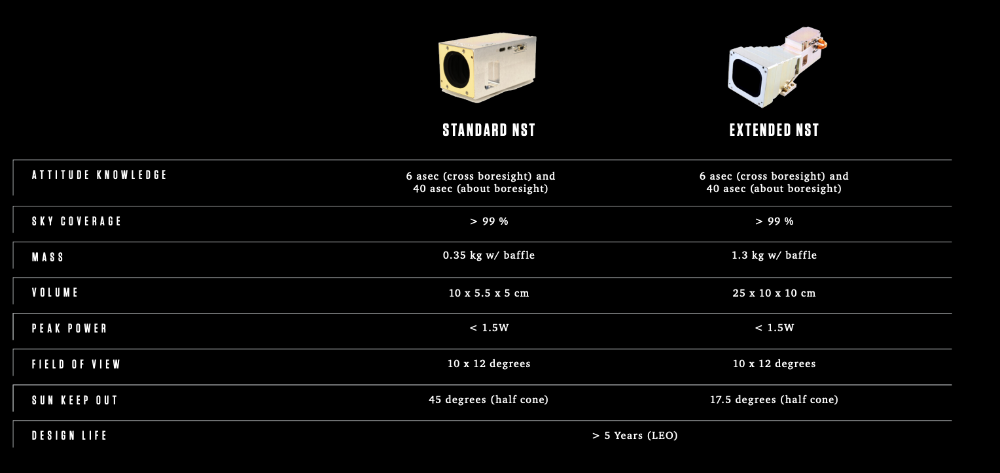

In [3]:
Image("BCT.png", width=500)

You can see that for <1.5 Watts, you're getting on the order of 0.001 degrees of attitude knowledge. And this isn't the most high-end version of a star tracker, it's just a common one. You can buy star trackers that provide accuracy up to two orders of magnitude better than that (see the High Accuracy Star Tracker from Ball, shown below). These aren't cheap sensors (the prices aren't listed by BCT, but these are likely in the 10's of thousands). However, they work well, and they generally have onboard intelligence that allows them to return an attitude measurement (like a quaternion) directly, rather than providing raw vector measurements that you must then filter into an attitude estimate.

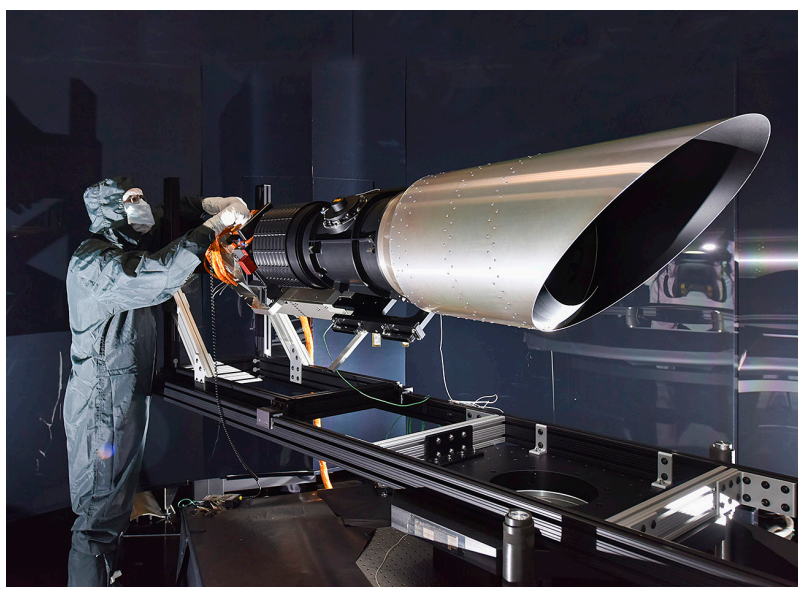

In [4]:
Image("Ball.png", width=500)

These also aren't tremendously difficult sensors to understand from a conceptual level.

Modern star trackers are all essentially just cameras that take pictures. Which raises the questions: What is a camera, and what is a picture?

#### What is a camera, and what is a picture?

A camera is a device which uses a lens that is placed some focal length $f$ away from an image plane in order to project light from the universe onto that image plane. The resulting picture is a 2D projection of the 3D world. If you know the focal length of the camera (how far away the image plane is from the lens), and if you know where a particular source of light (e.g. light from a particular star) lands on the image plane, than you can solve for the unit vector from the camera to the source of light in a straightforward way. (Pictures from Savransky's slides).

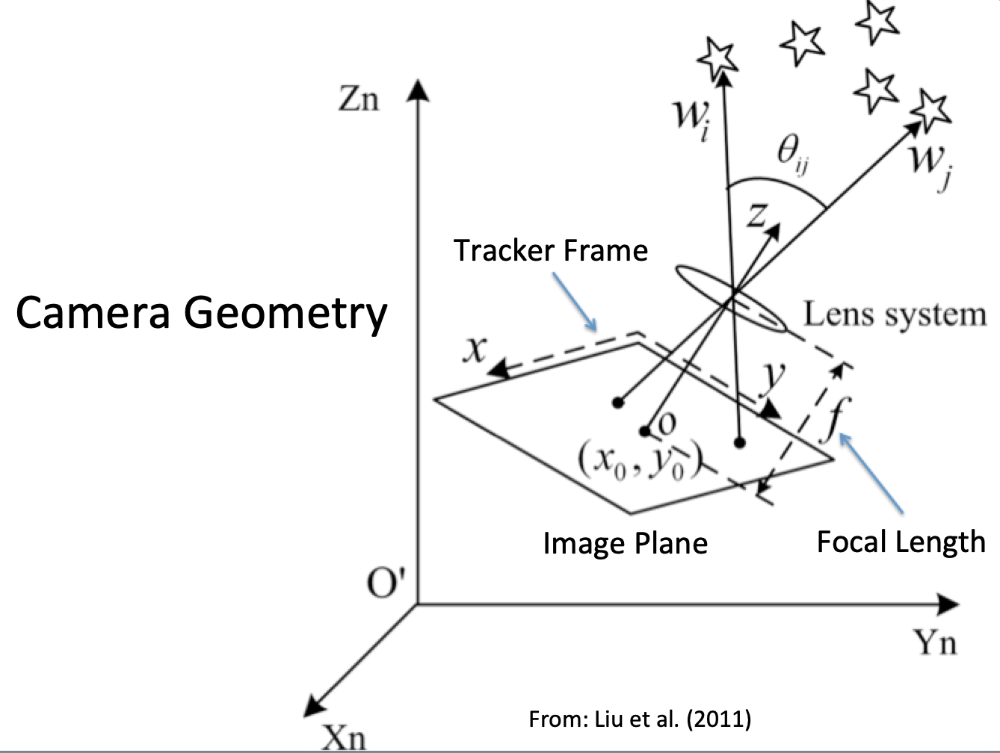

In [5]:
Image("sav1.png", width=500)

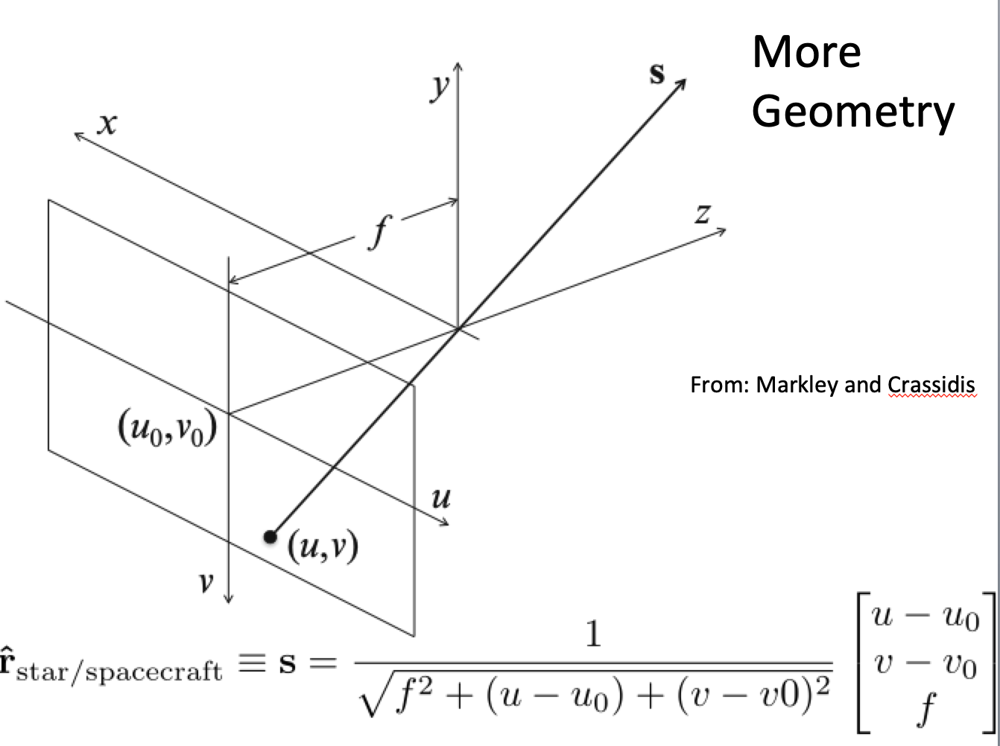

In [6]:
Image("sav2.png", width=500)

This yields a collection of unit vectors to stars. Each star tracker carries an onboard star catalog in memory, which it compares to star information from the gathered image. By comparing the measured locations of stars to the known locations of the stars per the star catalog, the star tracker can figure out which direction it is facing.

#### Why does this work so well?

In general, star trackers do *parameter estimation*. That is to say, they use a batch of measurements to estimate a set of static quantities (the four parameters of a quaternion, for example). For each new estimate, the star tracker gathers a new set of measurements and does another round of parameter estimation, without using any of the information from its previous estimate.

The particular measurements that the star tracker is using to generate these estimates are star positions. However, these measurements aren't perfect. There's noise and error associated with each of them.

So, the star tracker is searching for an orientation that makes the errors between each of the measured star positions and the star positions that we would expect to measure from that orientation as low as possible.

**Question**: You've all solved problems like this. What concept from linear algebra does this remind you of?

**Answer**: Least-squares estimation. We have an overdetermined system. That is to say, we have lots of redundant measurements in order to learn only a few quantities. By combining all of these measurements, we arrive at an estimate with an error that is significantly lower than the error associated with any particular measurement. I'm not going to get into the details of this because I'm not supposed to, but please take 4160 if you want to talk more about this.

The short answer: A star tracker is accurate because there are lots of measurements associated with each estimate.

**Question**: Do I need position knowledge to use a star tracker?

**Answer**: Not really. The stars are so far away that their relative positions don't change that much as the spacecraft moves around.

#### Limitations

You cannot point a star tracker at the sun, Earth, or Moon. It's also possible that you could mess up your measurement with image pollution from ejected propellant.

#### How to think about this

A star tracker does exactly what you would do if you were lost at sea in the middle of the night. You would look up, and you would use your eyes (cameras) to gather images of the stars. In your mind, you carry a star catalog. You know that particular, recognizable stars reside in a particular part of the sky. By comparing your view to your knowledge of the star locations, you could solve the attitude determination problem (in 2D) for your ship, and point it north.

### Sun/Earth Sensors

So, star trackers are the sensors that we use to measure the vectors to the stars. A different set of sensors are used to measure the vectors to the Earth or Sun.

Sun sensors come in different forms, but I'm going to talk about one of the most common. The sensor is essentially self explanatory just by looking at a schematic of its construction (again, from Savransky's slides):

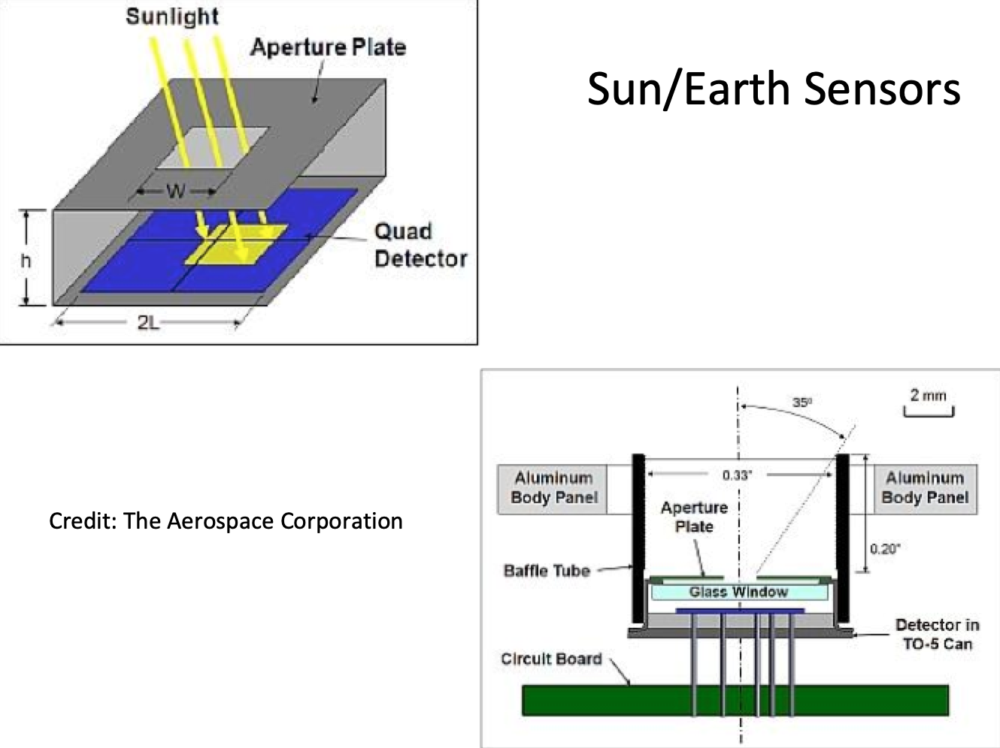

In [7]:
Image("sun.png", width=500)

A sun sensor is generally composed of an array of photodetector cells enclosed within an aluminum box. That aluminum box will have a small hole or a slit in the top. The direction to the sun can be determined by the particular subset of photodetectors that detect sunlight, under the assumption that all light waves from the sun are parallel (a good assumption).

**Question**: Can you think of any other tricks for measuring direction to the Sun, using infrastructure that will already be on your spacecraft?

**Answer**: How about current out of each of your solar cells?

You can use a similar trick to find the direction to the Earth, though you will want to use photodetectors that are sensitive in the infrared part of the spectrum. It's more common, however, to use an IR camera(s) for Earth vector measurement.

#### Limitations

Obviously, this sensor only works when the Sun is in view. It also only provides a single vector measurement. As we've discussed, we need at least two in order to solve the attitude problem. So, it must be used in conjunction with at least one other sensor.

**Question**: Do I need to know my location in order to use a Sun sensor?

**Answer**: It depends how far away from Earth I'm going. In Earth orbit, not really.

### Horizon Sensors

The orientation of the horizon can also be used to solve the attitude problem. In order to measure the direction normal to the horizon, spacecraft use horizon sensors. Horizon sensors are composed of an array of infrared sensors, as shown below. Earth radiates mostly in the IR part of the spectrum. So, the horizon can be found by looking for the barrier between IR emissions (Earth) and no IR emissions (space). See below.

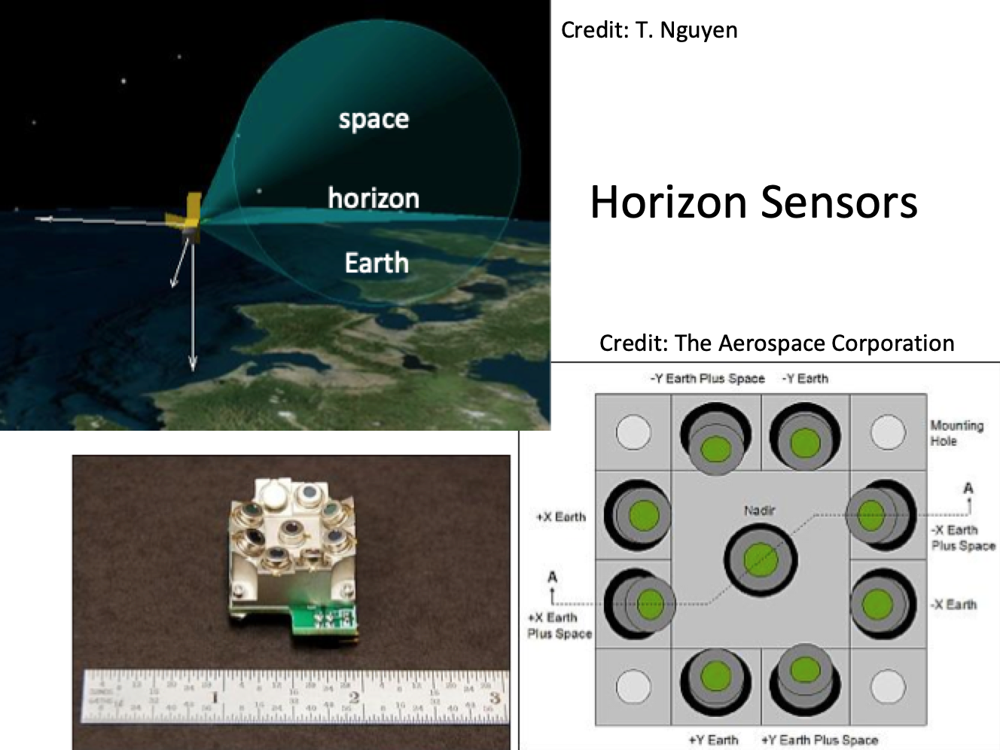

In [8]:
Image("horizon.png", width=500)

#### Limitations

You lose information from this sensor if the entire field of view contains space or Earth.

### Magnetometers

The direction of the local magnetic field, as measured by a magnetometer, can also provide a vector to use for performing attitude determination. Magnetometers come in various flavors (rotating coil, hall effect, magnetoresistive, fluxgate, SQUID, etc.). I'm going to focus on fluxgate magnetometers because they are among the most common.

#### Fluxgate magnetometers

These are very simple devices. A fluxgate magnetometer is composed of a magnetically susceptiple material wrapped with two coils of wire. Through one of those coils of wire, we drive an oscillating current. This causes the core to become magnetized, unmagnetized, reverse-magnetized, unmagnetized, magnetized, etc. That changing field induces a current in the second loop of wire (also wrapped around the core) which serves as our data line. If there is no background magnetic field, then the average induced current at the output will be zero. However, in the presence of a magnetic field, the induced current will be biased in one direction. This is how we measure the magnetic field strength in the direction that the coils are pointing.

To build a 3-axis magnetometer, we simply put three of these devices together in a mutually orthogonal configuration.

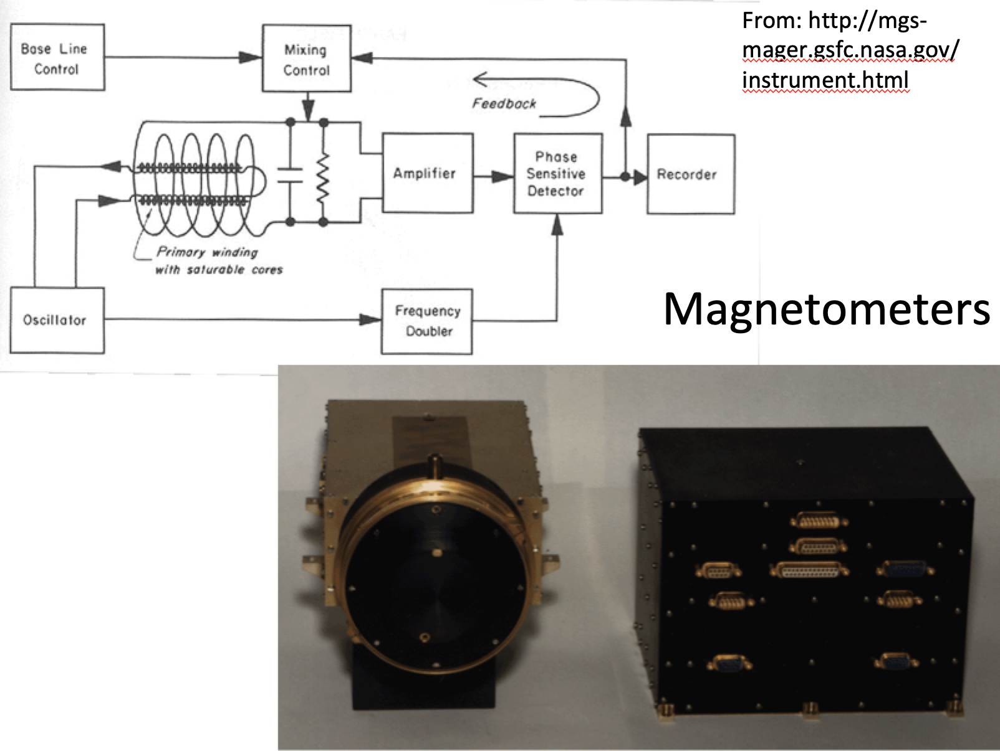

In [9]:
Image("magnet.png", width=500)

#### Limitations

**Question**: Do you need to know where you're located in order to use a magnetometer for attitude determination?

**Answer**: Yes. These are often used in conjunction with GPS, and they require a lookup table of magnetic field directions for locations around the Earth.

**Question**: Where would you mount a magnetometer in a spacecraft?

**Answer**: No single right answer. The point is to be careful of electromagnetic interference with your magnetometer from the other electrical activity going on in your spacecraft.

### CDGPS

#### How does GPS work?

Localization via GPS is based on ranging. Each GPS satellite continually sends transmissions that include the time at which they transmitted the message, and precise information about their own position. A GPS receiver will gather these transmissions from a number of different satellites (at least 4). This is sufficient information for the receiver to simultaneously calculate its own position, and the deviation of its own clock from the synchronized GPS clocks.

#### How does CDGPS work?

Recall that this information that the GPS satellites are sending (their positions and their times of transmission) are being sent on *radio waves*. Radio waves are like any other waves. They can be described by their magnitude, their phase, and their wavelength (or their frequency, which contains the same information as wavelength). Receivers can measure these characteristics of the wave. For CDGPS (carrier-phase differential GPS), the important characteristics of the received waves are their *phase* and their *wavelength*.

GPS operates on a couple different frequencies (called L1 and L2). The wavelengths associated with these frequencies are 19.05 cm for L1 and 24.45 cm for L2. (There's a third frequency, L3, that is used for nuclear detonation detection). 

**Question**: Why did they choose these frequencies?

**Answer**: We can't have signal attenuation from rain, snow, fog, clouds, etc. We also need a frequency that doesn't require a beam antenna or other sophisticated hardware to receive. And, we need a frequency that isn't attenuated by the ionosphere. These frequencies fit the requirements.

Carrier phase differential GPS uses the difference in phase between two receivers in order to determine, with to sub-wavelength resolution, the distance between those two receivers. Suppose that two receivers are separated by less than a wavelength, then you can tell the distance between the receivers by the difference in phase of the GPS signals.

#### How can you use this for attitude determination?

Suppose that you had an arrangement of receivers for which you knew, a priori, the separation among all of the receivers. Furthermore, assume that those receivers are separated by less than one wavelength. If that collection of receivers were oriented such that they all faced directly at the GPS satellite, then the distance that the signal would travel from the satellite to each receiver would be the same. As a consequence, there would be no phase difference among the receivers. However, if the arrangement of receivers were not oriented that way, then we would detect phase differences among each receiver that relates to the orientation of the collection. This way, we can use phase differentials from various GPS satellites to learn our orientation relative to those satellites.

From Savransky's slides:

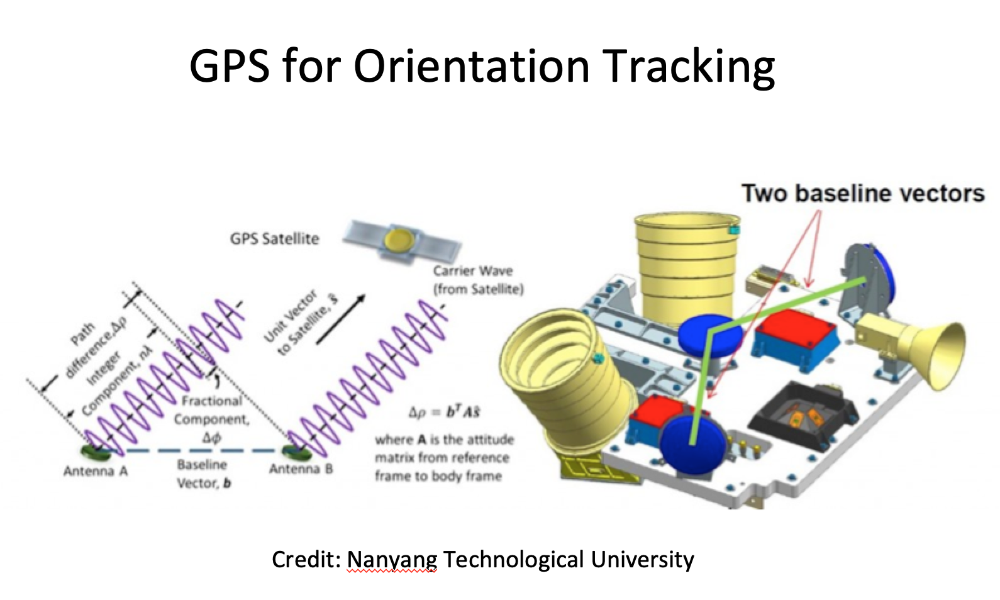

In [10]:
Image("GPS.png", width=500)

### Gyros

In principle, you can determine your angular rate by determining how your attitude changes with time. In practice, everyone uses gyroscopes to measure angular rate. These come in various flavors, the most common on spacecraft include MEMS gyros (for cheaper cubesats), and fiber optic/ring-laser gyros on more sophisticated spacecraft.

##### MEMS

MEMS stands for microelectromechanical systems. Small things that involve mechanics and electronics. MEMS gyros are the kind that you'll find in your cell phone, in Wii remote controllers, and on essentially anything else that is built on a printed circuit board. The chipsats use MEMS gyros.

MEMS are, I think, and underappreciated frontier of really awesome engineering. Engineers working in this field are solving some of the hardest problems that are being undertaken, particularly outside of the DoD. They are building machines that must align optical equipment to within nanometers, and must do so at unbelievable speed and in a vaccuum. It's an area that seems to lack the sexiness of fields like spacecraft or automotive engineering, but you might consider looking into internships with these sorts of companies if you're into solving very, very hard problems.

MEMS gyros are "vibrating structure gyroscopes." In my opinion, these devices (and other MEMS devices) are among the most amazing things that humanity has created.

These too come in various flavors. All of these flavors are based on the fundamental idea that, if you oscillate test masses in plane and then rotate that plane, you get a Coriolis force. This Coriolis force produces an out-of-plane motion which you can measure to deduce rotation rate. MEMS gyros build these structures lithographically.

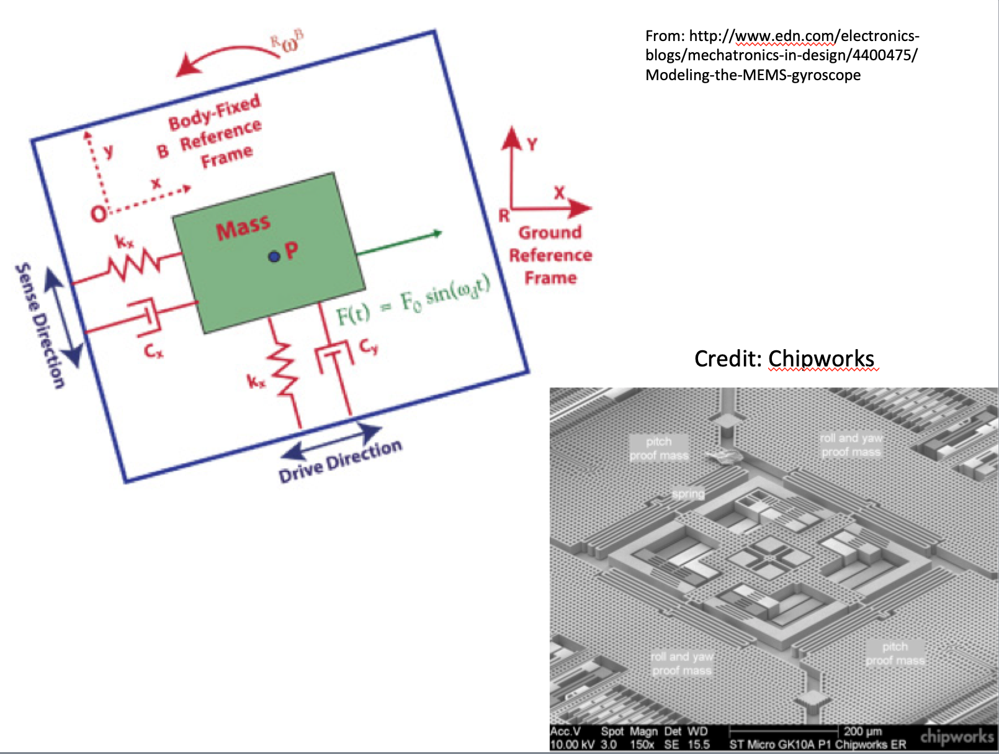

In [11]:
Image("mem.png", width=500)

#### *AN AWESOME BY-THE-WAY*

Bugs use vibrating structure gyroscopes! Two Orders of flying insects (including houseflies and gnats) have a pair of organs called Halteres that behave exactly like vibrating structure gyroscopes and provide information about body rotation during flight. These organs hang off of the body and vibrate during flight. Any rotation of the body induces a Coriolis force, which the insect can detect using specialized sensory organs. This provides extremely fast feedback to wing steering muscles.

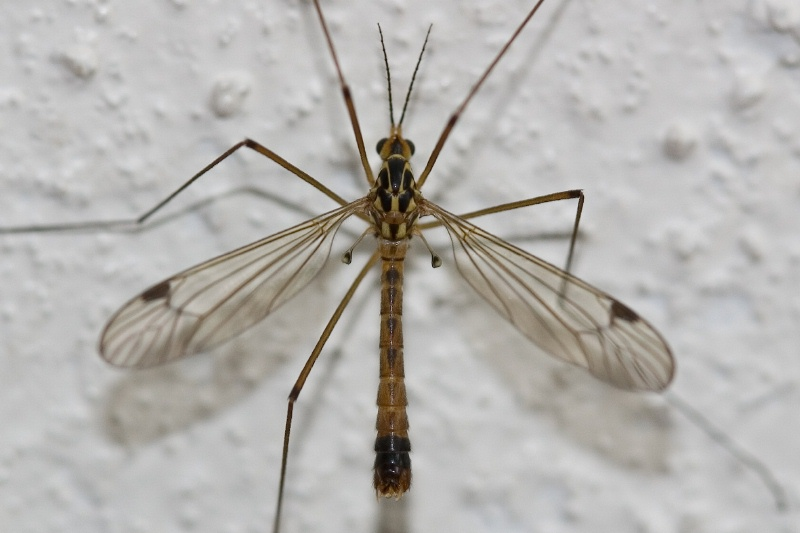

In [12]:
Image("cranefly.jpg", width=800)

##### Fiber-optic

There's another type of gyroscope that uses entirely different physics. These are fiber-optic gyroscopes, which are extremely accurate and are based on the Sagnac effect.

##### **Sagnac Effect**

We know that the speed of light is fixed. No matter how fast you're moving, you will always measure light to be going at precisely the same speed (assuming the the medium through which it's traveling does not change). This has some bizarre consequences. The Sagnac effect is one of those consequences.

Suppose that we split a beam of light. We send half the beam of light down one path, and we send the other half down a path of identical length. Then, we allow for the two beams of light to recombine.

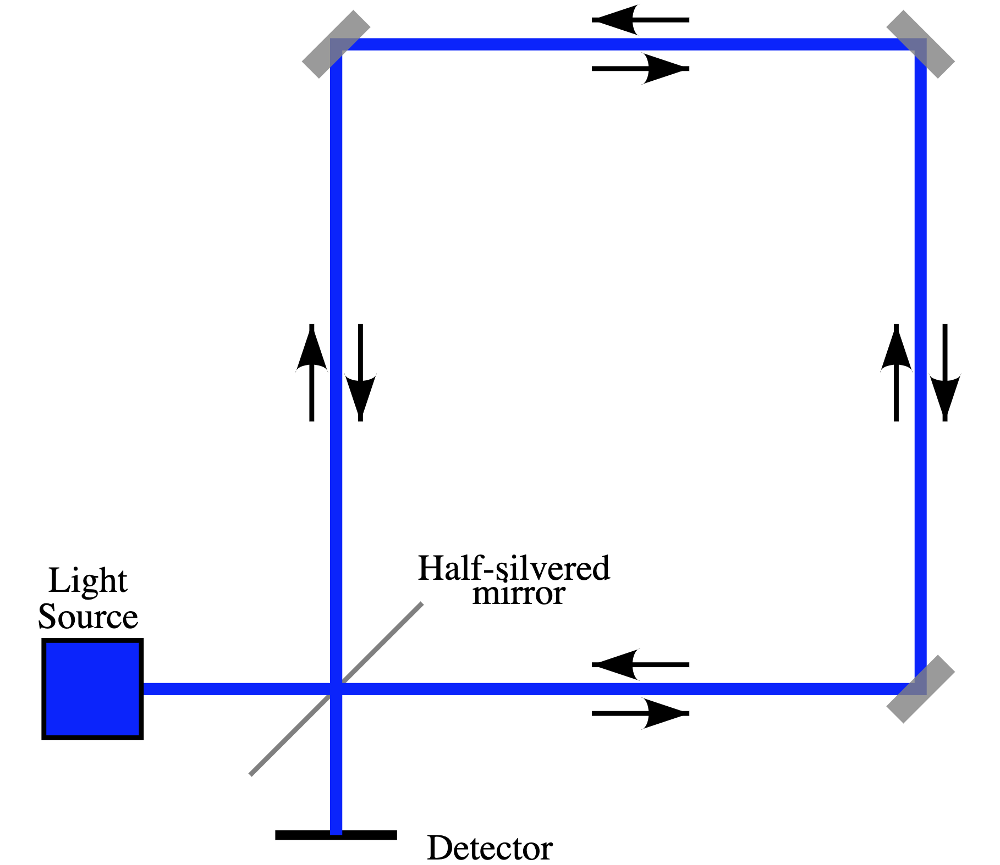

In [13]:
Image("sagnac.png", width=500)

**Question**: In the situation in which nothing is moving/rotating, how do you expect for the two beams of light to recombine?

**Answer**: They will combine perfectly constructively. Each will have been split at the same phase, and will have travelled an identical distance. When they meet again, they will be at the same phase and the two waves will add together, recreating the original wave.

**Question**: What happens if those two paths form a ring, and the whole structure is rotating?

**Answer**: Something interesting. The light traveling along the path that carries it in the direction of rotation has a farther distance to travel than the light moving along the path opposite to the direction of rotation. However, they are both forced to travel at the same speed along each of their paths. When they recombine at the end of their paths, they will be at different phases. Just how different those phases are depends on the rate of rotation and the length of the paths that they've traveled.

This is the physics at the core of fiber optic gyros and ring laser gyros. We split light, send it down two paths, allow it to recombine, and look at the diffraction patterns caused by rotation-induced phase differences. This can yield measurements with error as low as 1e-5 deg/sec and may contain as much as 5km of fiber-optic cable. Fiber-optic gyros have no moving parts.

Among the most commonly used fiber-optic gyros (in spacecraft, planes, and helicopters) is the LN-200 from Northrop Grumman, pictured below.

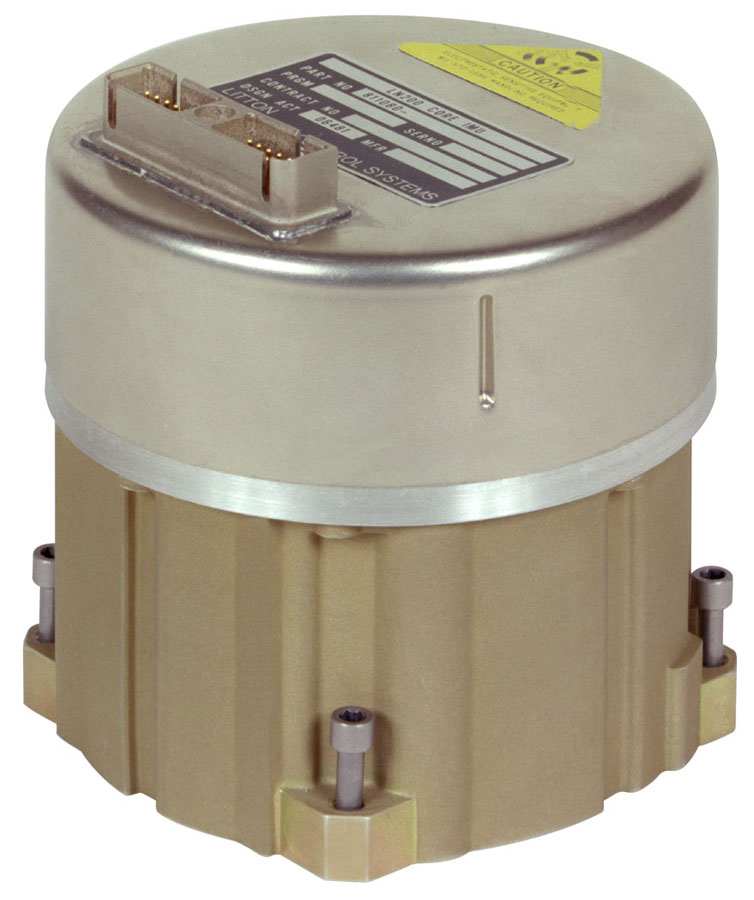

In [14]:
Image("ln200.jpg", width=400)

### Computer vision/optical navigation

As spacecraft become less computationally constrained, computer vision and optical navigation are becoming viable options. We can expect for this to become increasingly common. Camera/optical equipment will likely be as common on spacecraft in a decade as gyroscopes are on spacecraft now. 

The leader of this field is **John Christian** of RPI.

#### What is optical navigation?

Optical navigation uses cameras in order to determine a spacecraft's trajectory and orientation. Typically, these sorts of methods are employed in the vicinity of celestial bodies (Moon, Earth, etc) where there is rich information in the surface features.

Optical navigation has been used, in one form or another, for a long time. Gemini, Apollo, Skylab, Space Shuttle, Mariner, Voyager/Cassini, Galileo, and more. With a camera, one can gather information including the apparent diameter and centroid of a celestial body, the angle between the horizon of a celestial body and a reference star, the angle between a surface feature and a reference star, the orientation of an oblate body, and the orientation of surface features on the body. Christian and others have investigated using all of these sources of information for position and attitude determination.

## Attitude Feedback Control

Take 6060!